<a name="top"></a>
<div style="width:1000 px">

<div style="float:right; width:98 px; height:98px;">
<img src="https://cdn.miami.edu/_assets-common/images/system/um-logo-gray-bg.png" alt="Miami Logo" style="height: 98px;">
</div>

<h1>MPO 624: EOF analysis of video file</h1>

<div style="clear:both"></div>
</div>

<hr style="height:2px;">

### Links to subsections
1. <a href="#read">Read a video</a>
1. <a href="#trunc">Display EOF truncations of it</a>

Might be a good idea to compress it for size, with handbrake or ffmpeg (Python) or on web https://www.freeconvert.com/video-compressor


In [6]:
%matplotlib inline 
import matplotlib.pyplot as plt
import numpy as np
import imageio
from PIL import Image 
import matplotlib.animation as manimation

plt.rcParams['animation.html'] = 'jshtml'

In [7]:
# 2022: had to ip install imageio-ffmpeg, conda install imageio

## Read the video data

In [8]:
filename = '/Users/brianmapes/Box/MPO624_data/CrabSurf.mov'
vid = imageio.get_reader(filename,  'ffmpeg')

#for i, im in enumerate(vid):
#    print('Mean of frame %i is %1.1f' % (i, im.mean()))

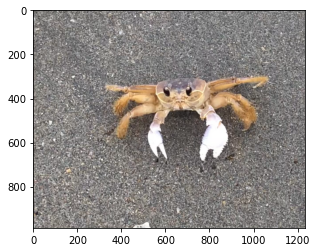

In [9]:
# First time step image 
im = vid.get_data(0)
plt.imshow(im)

# How to shrink image array size 

In [47]:
np.shape(im)

(988, 1234, 3)

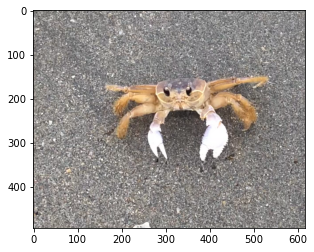

In [48]:
#im_small = im.reshape(247, 4, 617, 2, 3).max(axis=(1, 3))
im_small = im.reshape(494, 2, 617, 2, 3).max(axis=(1, 3))
plt.imshow(im_small)

In [24]:
i*stride

360

In [49]:
NFRAMES=50
stride = 6

# im_small = im.reshape(494, 2, 617, 2, 3).max(axis=(1, 3))

dataset = np.zeros( (NFRAMES,494,617, 3) )

for i in range(0,(NFRAMES)): 
    im = vid.get_data(i*stride)
    dataset[i,:,:,:] = im.reshape(494, 2, 617, 2, 3).max(axis=(1, 3))

np.shape(dataset)

(50, 494, 617, 3)

## Now,  how to display arrays that shape as a movie?

In [ ]:
# Build the frames of the movie
fig, ax = plt.subplots(figsize=(10,5))
imcolor = Image.fromarray(np.uint8(dataset[0,:,:,:]))
frame = ax.imshow(imcolor);

# Build the artists array
artists = []
for it in range(0, NFRAMES-1):   
#    imcolor = cv2.cvtColor(dataset[it,:,:,:], cv2.COLOR_BGR2RGB)
    imcolor = Image.fromarray(np.uint8(dataset[it,:,:,:]))
    frame = ax.imshow(imcolor)
    artists.append([frame]) # NOTE THE LIST

anim = manimation.ArtistAnimation(fig, artists, interval=100)
anim

<a name="trunc"></a>
## Now take EOFs and truncate the reconstruction

In [55]:
from eofs.standard import Eof # import standard eofs from python eofs package, 
                              # to install eofs package use `conda install eofs` in environment you want to add it to
                              # for API see http://ajdawson.github.io/eofs/api/index.html for more information.

In [56]:
# Create an EOF solver to do the EOF analysis. 

# Unweighted (just gridpoint variance)

solver = Eof( dataset )

## Having done all the computations, just unpack and plot

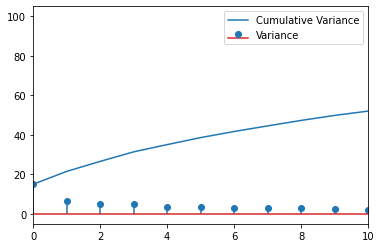

In [57]:
variance=solver.varianceFraction() # this is same as eigenvals/sum(eigenvals)

plt.stem(variance*100.0,label="Variance")
plt.plot(variance.cumsum()*100.0,label="Cumulative Variance")
plt.xlim(0,10,1)
plt.legend()

### Look at the EOF structures and PC time series

In [58]:
# Retrieve the EOFs and PCs
eofs = solver.eofs()
pcs = solver.pcs()

# Retrieve the correlation between the leading PC time series 
# and the input SST anomalies at each grid point.
# eofsasCorr = solver.eofsAsCorrelation()

# Retrieve the EOF expressed as the covariance between the leading  PC time series 
# and the input SST anomalies at each grid point.
# eofsasCov = solver.eofsAsCovariance()

## Is it a data reduction (compression) yet? No!

In [65]:
print(np.shape(eofs), ' plus ', np.shape(pcs), 'vs. ',  np.shape(dataset))

(50, 494, 617, 3)  plus  (50, 50) vs.  (50, 494, 617, 3)


## We need the mean image to add the EOFs of variability to

(494, 617, 3)


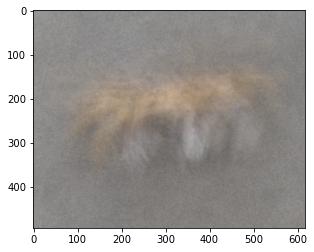

In [66]:
meanimarr = dataset.mean(axis=0)
print(np.shape(meanimarr)) 

meanimg = Image.fromarray(np.uint8(meanimarr))

plt.imshow(meanimg)

## Let's look at the modes

In [67]:
def plot_image_ts(image,ts, label1, label2): 
    fig = plt.figure(figsize=(10, 4))

    ax = fig.add_subplot(121)
    cmap = ax.imshow(image)
    ax.set_title(label1)
    
    ax2 = fig.add_subplot(122)
    ax2.plot(ts) 
    ax2.set_title(label2)

<a name="modes"></a>
## Let's look at the modes

-5.4119210962709206 2.3774358120839447
-2.6223577924794963 3.965938079142204
-4.500782173679489 6.519669664915488


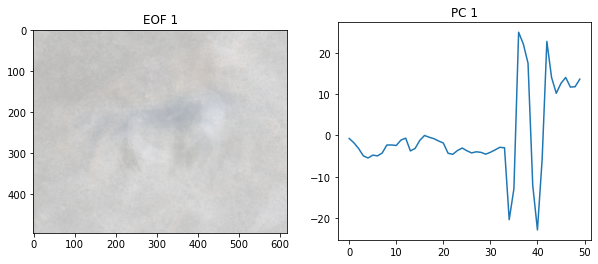

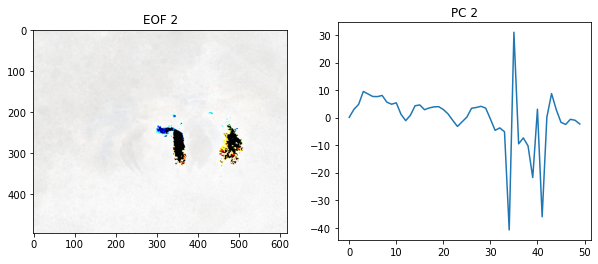

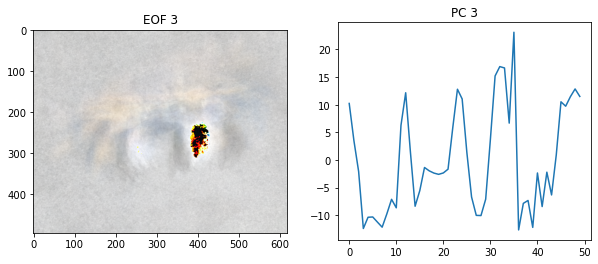

In [68]:
# Put all the magnitude info into the PC for clarity of plotting
for MODE in [0,1,2]:
    xystd = np.std(eofs[MODE,:,:,:].ravel())
    norma = eofs[MODE,:,:,:]/xystd
    print(norma.min(), norma.max())
    imcolor = Image.fromarray(np.uint8(  (norma+norma.min())*(norma.max()-norma.min())   ))
    plot_image_ts(imcolor, pcs[:,MODE]*xystd, \
            'EOF '+str(MODE+1), 'PC '+str(MODE+1))

## Check orthogonality

In [72]:
np.corrcoef(eofs[0,:,:,:].ravel(), eofs[1,:,:,:].ravel()) # not right measure of orthogonality, says pkg. author

array([[1.        , 0.34927835],
       [0.34927835, 1.        ]])

In [73]:
np.corrcoef(pcs[:,0], pcs[:,1])

array([[1.00000000e+00, 4.89373013e-18],
       [4.89373013e-18, 1.00000000e+00]])

## Truncated reconstructions: animated
Grab some cells from Unidata's workshop notebook on making animations.
You have to make one image, then animate the others

In [74]:
import matplotlib.animation as manimation
plt.rcParams['animation.html'] = 'jshtml'

In [75]:
def recon(TRUNC, time): 
    data = eofs[0,:,:,:] * pcs[time,0] # Always include the first one
    for i in range(1,TRUNC):
        data += eofs[i,:,:,:] * pcs[time,i]
    return(data)

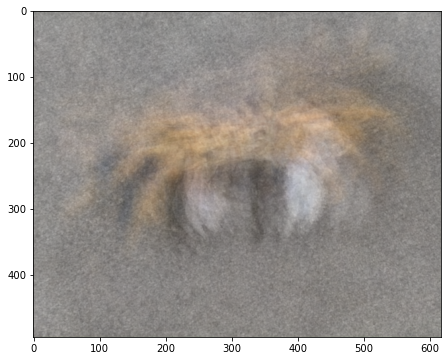

In [85]:
# Make one frame of the movie to set the picture size 
TRUNC = 5

fig, ax = plt.subplots(figsize=(14,6))

# Construct the data array, then the "Image" (3-channel color)
array = meanimarr + recon(TRUNC,0)
img = Image.fromarray(np.uint8(array));

im = ax.imshow(img)

In [91]:
# TRUNC = 2 ## Reconstruction truncation level (how many modes) 
TRUNC = NFRAMES ## UNCOMPROMISED: Recover the full data
TRUNC=10 

# Build the "artists" list of frames for the animation
artists = []

for it in range(0, len(pcs[:,0])-1):   # time loop over frames

    # The data, then the image
    array = meanimarr + recon(TRUNC,it)
    img = Image.fromarray(np.uint8(array))

    im = ax.imshow(img)
    ax.set_title('Truncation '+str(TRUNC)+' modes')
    artists.append([im]) # NOTE THE LIST

anim = manimation.ArtistAnimation(fig, artists, interval=500)

/Users/brianmapes/opt/miniconda3/envs/MPO624/lib/python3.8/site-packages/matplotlib/animation.py:889: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


In [86]:
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 1000  # 1 GB

In [ ]:
anim

In [ ]:
TRUNC = 2 ## Reconstruction truncation level (how many modes)

artists = []

for it in range(0, len(pcs[:,0])):   
    # The data, then the image
    array = meanimarr + recon(TRUNC,it) *0.8 # 80% amplitude anomalies, so it doesn't hit zero and make zany colors
    img = Image.fromarray(np.uint8(array))

    im = ax.imshow(img)
    ax.set_title('Truncation '+str(TRUNC)+' modes')
    artists.append([im]) # NOTE THE LIST

anim = manimation.ArtistAnimation(fig, artists, interval=200)
anim

In [89]:
TRUNC = 3 ## Reconstruction truncation level (how many modes)

artists = []

for it in range(0, len(pcs[:,0])):   
    # The data, then the image
    array = meanimarr + recon(TRUNC,it) *0.8 # 80% amplitude anomalies, so it doesn't hit zero and make zany colors
    img = Image.fromarray(np.uint8(array))

    im = ax.imshow(img)
    ax.set_title('Truncation '+str(TRUNC)+' modes')
    artists.append([im]) # NOTE THE LIST

anim = manimation.ArtistAnimation(fig, artists, interval=200)
anim